# Figure 4c

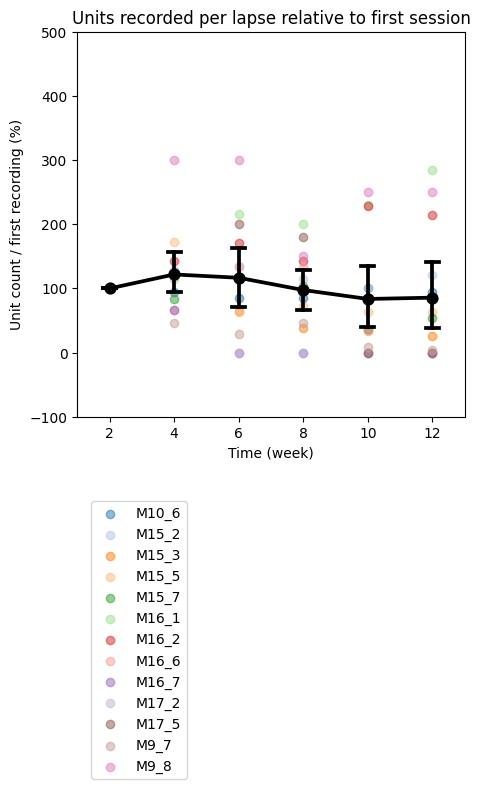

Successfully redrawn units per lapse figure.


In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === Load NPZ ===
source_data_dir = "../source data/Figure 4"  
npz_path = os.path.join(source_data_dir, "units_per_lapse_data.npz")
npz_file = np.load(npz_path, allow_pickle=True)

# Extract stored data
stats = pd.DataFrame(npz_file["stats"].item())  # Convert back to DataFrame
lapses = npz_file["lapses"]
subjects = npz_file["subjects"]

# === Plot ===
colors = {subject: plt.cm.tab20(i) for i, subject in enumerate(subjects)}

fig = plt.figure(figsize=(5, 5))
ax = plt.gca()

for subject in subjects:
    subject_stats = stats[stats['subject'] == subject]
    if sum(subject_stats['unit_percent']) == 0:
        continue
    ax.scatter([list(lapses).index(lapse) for lapse in subject_stats['lapse']], 
               subject_stats['unit_percent'], 
               label=subject, alpha=0.5, color=colors[subject])

sns.pointplot(data=stats, x='lapse', y='unit_percent', ax=ax, color='black', capsize=0.2)

ax.set_xlabel('Time (week)')
ax.set_ylabel('Unit count / first recording (%)')
ax.set_title('Units recorded per lapse relative to first session')
ax.set_ylim(-100, 500)
ax.legend(bbox_to_anchor=(0.3, -0.2))

# Save figure
# figure_folder = "./Figure_3"
# os.makedirs(figure_folder, exist_ok=True)
# plt.savefig(f'{figure_folder}/units_per_lapse_redrawn.pdf', transparent=True, bbox_inches='tight')
plt.show()
plt.close()

print("Successfully redrawn units per lapse figure.")

# Figure 4d

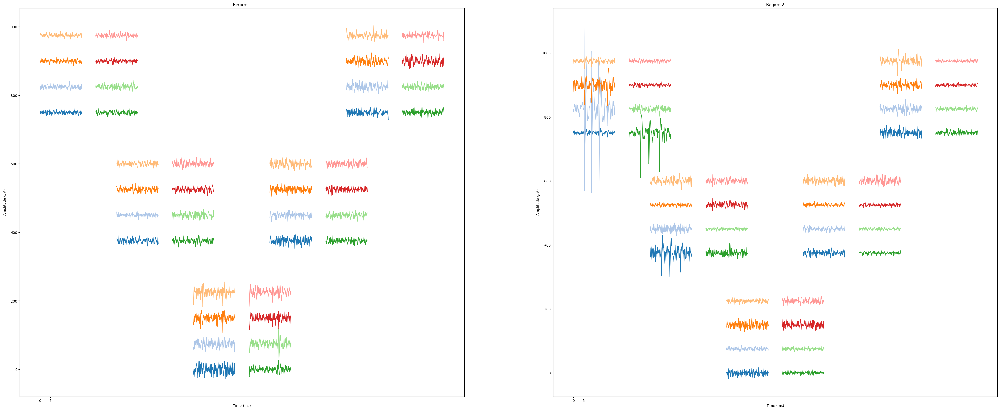

 Successfully redrawn zoomed raw traces.


In [3]:
# Figure 3d
import os
import numpy as np
import matplotlib.pyplot as plt

# === Load NPZ ===
source_data_dir = "../source data/Figure 4"  
npz_path = os.path.join(source_data_dir, "zoomed_traces.npz")
npz_file = np.load(npz_path, allow_pickle=True)

# Extract stored data
region1_traces = npz_file["region1_traces"]
region2_traces = npz_file["region2_traces"]
sampling_frequency = npz_file["sampling_frequency"]
channel_indices = npz_file["channel_indices"].tolist()  
shank_locations = npz_file["shank_locations"].tolist()  
distance_fold = tuple(npz_file["distance_fold"])  
trace_gap = tuple(npz_file["trace_gap"])  
trace_locations = npz_file["trace_locations"]

# === Replot the data exactly as before ===
plt.figure(figsize=(50, 20))

# === Plot Region 1 ===
ax = plt.subplot(1, 2, 1)
for shank, shank_channels in enumerate(channel_indices):
    shank_location = shank_locations[shank]
    for trace_index, trace in enumerate(region1_traces[shank_channels]):
        ax.plot(np.arange(trace.shape[0]) + shank_location[0] * distance_fold[0] + trace_locations[trace_index][0], 
                trace + shank_location[1] * distance_fold[1] + trace_locations[trace_index][1], 
                color=plt.cm.tab20(trace_index % 20))  # 🔥 Ensure color consistency

ax.set_title('Region 1')
ax.set_xticks([0, 0.005 * sampling_frequency], [0, 5])
ax.set_xlabel('Time (ms)')
ax.set_ylabel(r'Amplitude ($\mu$V)')

# === Plot Region 2 ===
ax = plt.subplot(1, 2, 2)
for shank, shank_channels in enumerate(channel_indices):
    shank_location = shank_locations[shank]
    for trace_index, trace in enumerate(region2_traces[shank_channels]):
        ax.plot(np.arange(trace.shape[0]) + shank_location[0] * distance_fold[0] + trace_locations[trace_index][0], 
                trace + shank_location[1] * distance_fold[1] + trace_locations[trace_index][1], 
                color=plt.cm.tab20(trace_index % 20))  # 🔥 Ensure color consistency

ax.set_title('Region 2')
ax.set_xticks([0, 0.005 * sampling_frequency], [0, 5])
ax.set_xlabel('Time (ms)')
ax.set_ylabel(r'Amplitude ($\mu$V)')

# Save figure
# figure_folder = "./Figure_3"
# os.makedirs(figure_folder, exist_ok=True)
# plt.savefig(f'{figure_folder}/synced_traces_zoomed_redrawn.pdf', transparent=True)
plt.show()
plt.close()

print(" Successfully redrawn zoomed raw traces.")

# Figure 4e

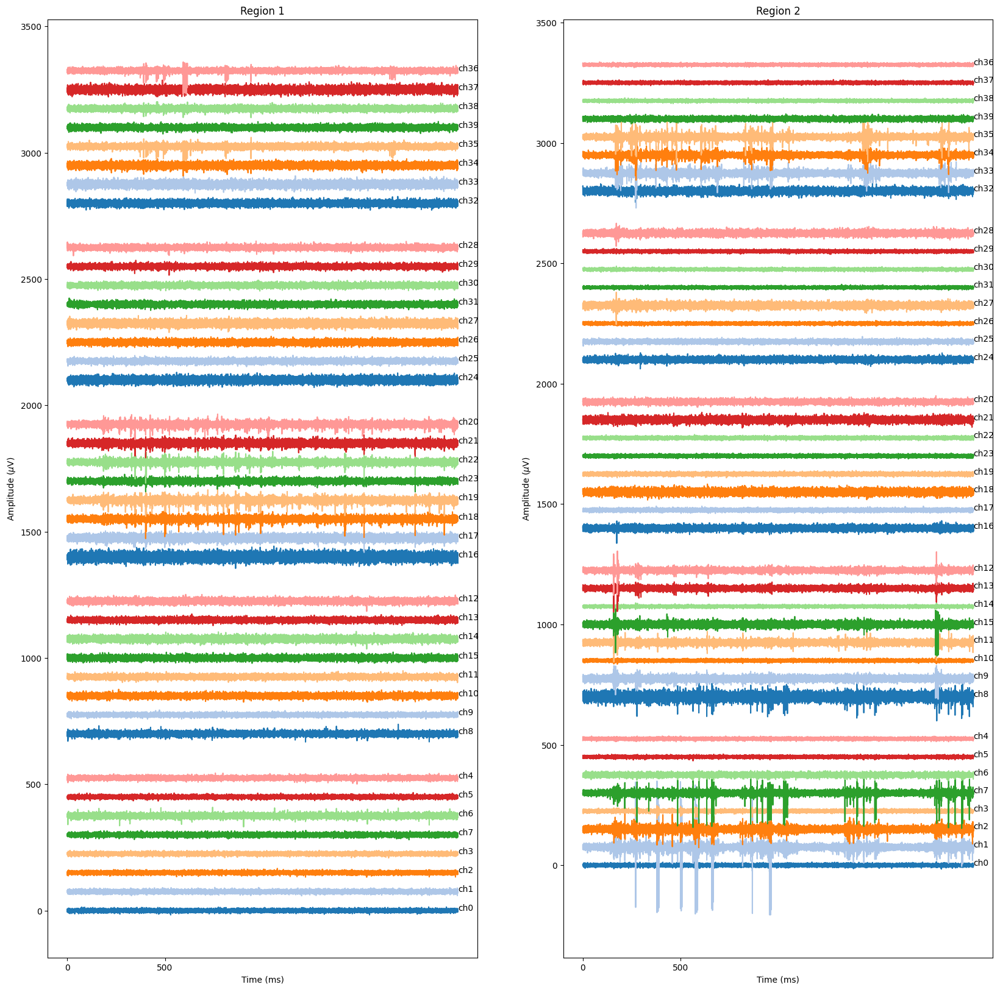

 Successfully redrawn raw traces.


In [2]:
# Figure 4e
import os
import numpy as np
import matplotlib.pyplot as plt

# === Load NPZ ===
source_data_dir = "../source data/Figure 4"  
npz_path = os.path.join(source_data_dir, "raw_traces_compressed.npz")
npz_file = np.load(npz_path, allow_pickle=True)

# Extract stored data
region1_traces = npz_file["region1_traces"]
region2_traces = npz_file["region2_traces"]
sampling_frequency = npz_file["sampling_frequency"]
channel_indices = npz_file["channel_indices"].tolist()  # Ensure list format

# === Replot the data exactly as before ===
trace_gap = 75
shank_gap = 100

plt.figure(figsize=(20, 20))

# === Plot Region 1 ===
ax = plt.subplot(1, 2, 1)
for shank, shank_channels in enumerate(channel_indices):
    for trace_index, trace in enumerate(region1_traces[shank_channels]):
        y = trace_index * trace_gap + shank * (shank_gap + len(shank_channels) * trace_gap)
        ax.plot(trace + y, color=plt.cm.tab20(trace_index % 20))  # 🔥 Ensure color consistency
        ax.text(len(trace), y, f'ch{shank_channels[trace_index]}')

ax.set_xticks([0, 0.5 * sampling_frequency], [0, 500])
ax.set_xlabel('Time (ms)')
ax.set_ylabel(r'Amplitude ($\mu$V)')
ax.set_title('Region 1')

# === Plot Region 2 ===
ax = plt.subplot(1, 2, 2)
for shank, shank_channels in enumerate(channel_indices):
    for trace_index, trace in enumerate(region2_traces[shank_channels]):
        y = trace_index * trace_gap + shank * (shank_gap + len(shank_channels) * trace_gap)
        ax.plot(trace + y, color=plt.cm.tab20(trace_index % 20))  # 🔥 Ensure color consistency
        ax.text(len(trace), y, f'ch{shank_channels[trace_index]}')

ax.set_xticks([0, 0.5 * sampling_frequency], [0, 500])
ax.set_xlabel('Time (ms)')
ax.set_ylabel(r'Amplitude ($\mu$V)')
ax.set_title('Region 2')

# Save figure
# figure_folder = "./Figure_3"
# os.makedirs(figure_folder, exist_ok=True)
# plt.savefig(f'{figure_folder}/synced_traces_redrawn.pdf', transparent=True)
plt.show()
plt.close()

print(" Successfully redrawn raw traces.")

# Figure 4f,h

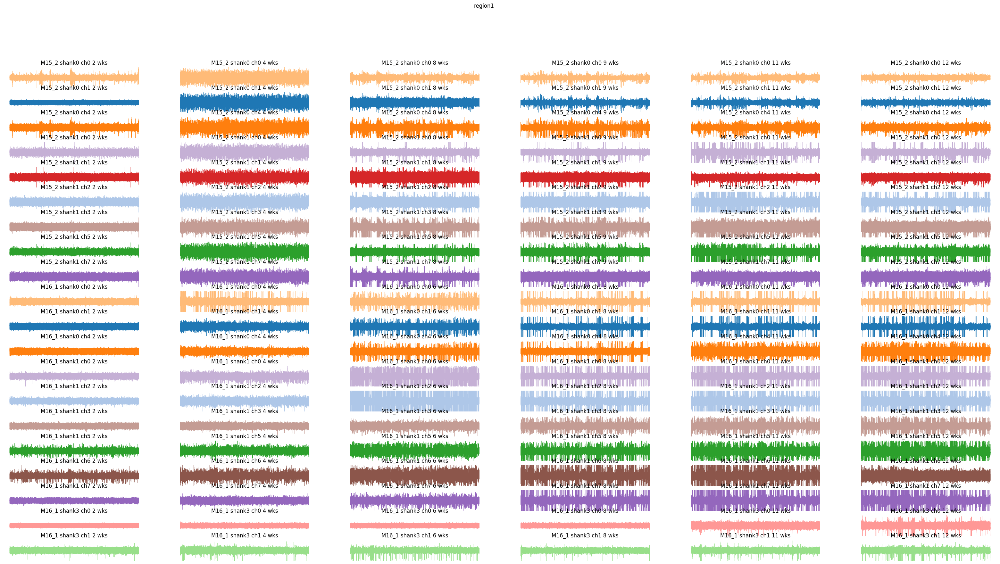

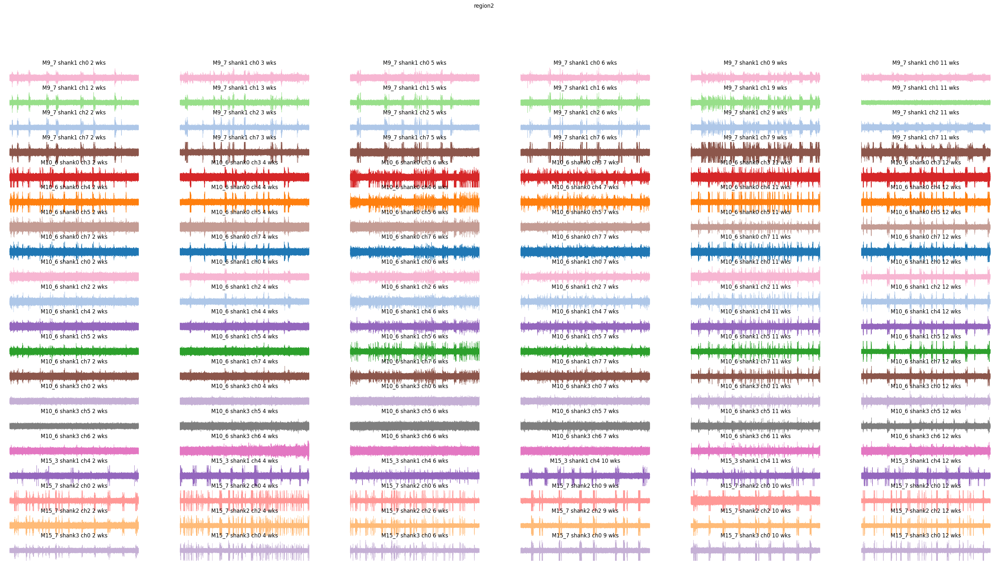

✅ Finished plotting both brain regions.


In [6]:
import numpy as np
import matplotlib.pyplot as plt
import os

input_dir = "../source data/Figure 4/single_traces"
region_names = ["region1", "region2"]

for region in region_names:
    # 读取该脑区所有 trace 文件
    all_files = sorted(f for f in os.listdir(input_dir) if f.endswith(".npz") and region in f)
    trace_entries = []

    for file in all_files:
        data = np.load(os.path.join(input_dir, file), allow_pickle=True)
        trace_entries.append({
            "subject": data["subject"].item(),
            "shank": data["shank"].item(),
            "channel": data["channel"].item(),
            "time_lapse": data["time_lapse"].item(),
            "trace": data["trace"]
        })

    if len(trace_entries) == 0:
        print(f"⚠️ No data found for {region}, skipping...")
        continue

    # 设置画布
    fig = plt.figure(figsize=(40, len(trace_entries) // 6))
    fig.suptitle(region)

    unique_channels = list(set((e["shank"], e["channel"]) for e in trace_entries))
    channel_color_map = {ch: i % 20 for i, ch in enumerate(unique_channels)}

    for idx, entry in enumerate(trace_entries):
        shank = entry["shank"]
        channel = entry["channel"]
        color_idx = channel_color_map[(shank, channel)]

        ax = plt.subplot(len(trace_entries) // 6, 6, idx + 1)
        ax.plot(entry["trace"], linewidth=0.5, color=plt.cm.tab20(color_idx))
        ax.set_ylim(-75, 75)
        ax.set_axis_off()
        ax.set_title(f'{entry["subject"]} shank{shank} ch{channel} {entry["time_lapse"]} wks')

    plt.show()
    plt.close()

print("✅ Finished plotting both brain regions.")


# Figure 4g,i

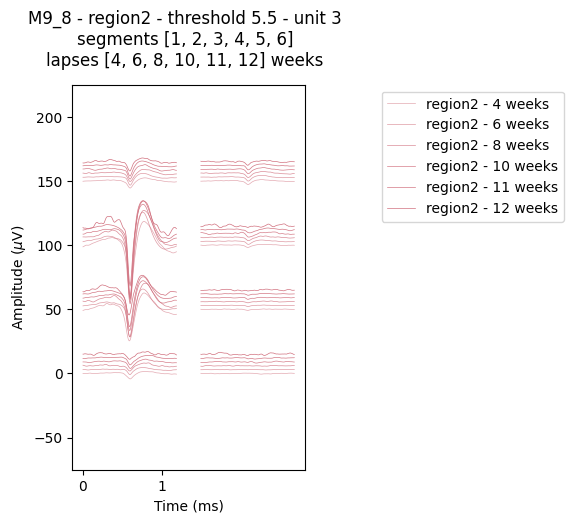

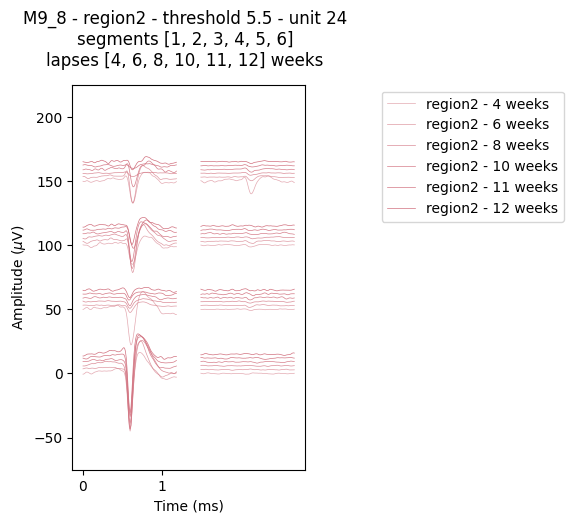

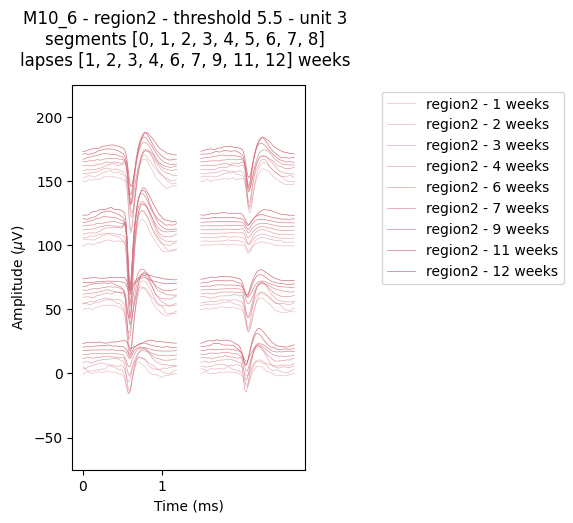

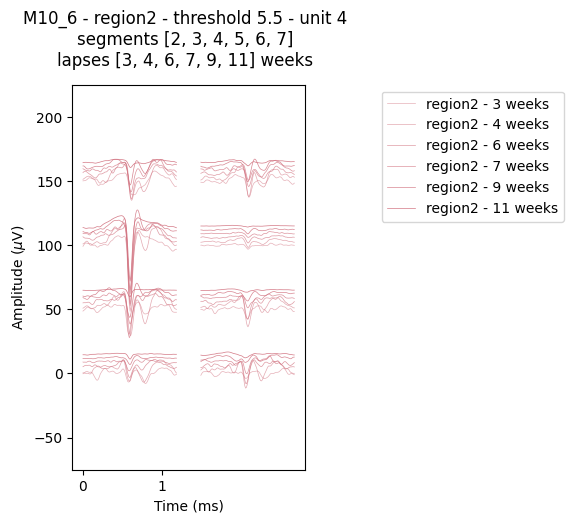

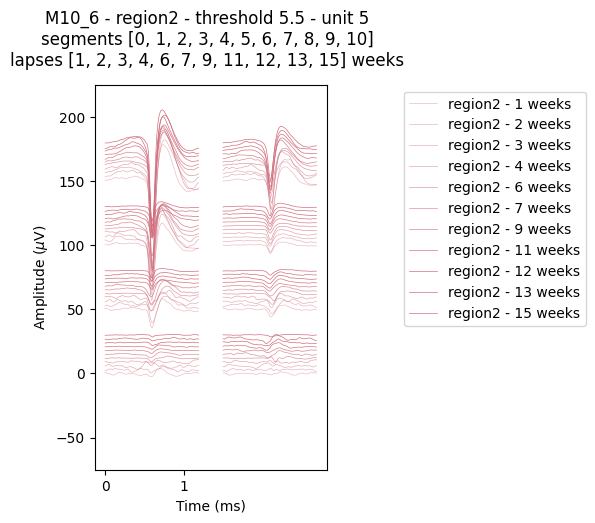

...

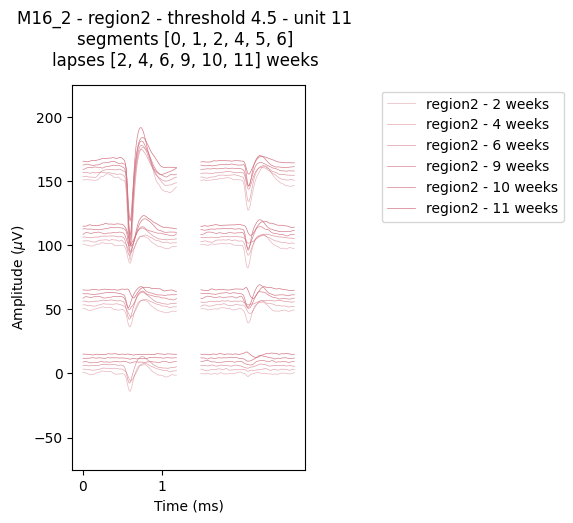

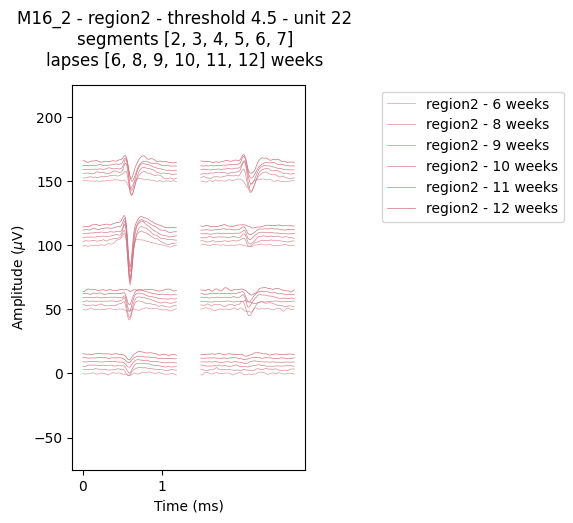

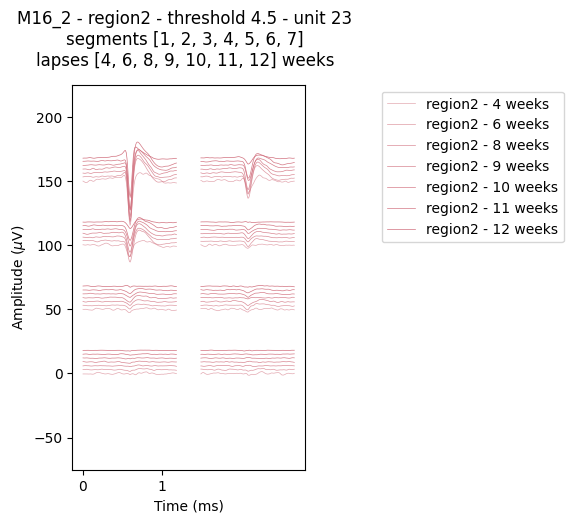

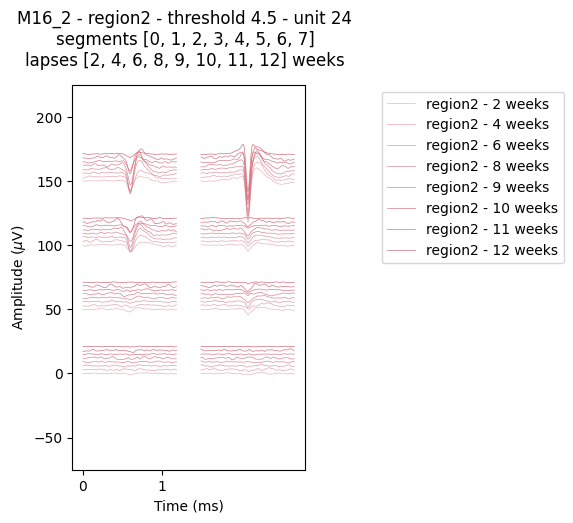

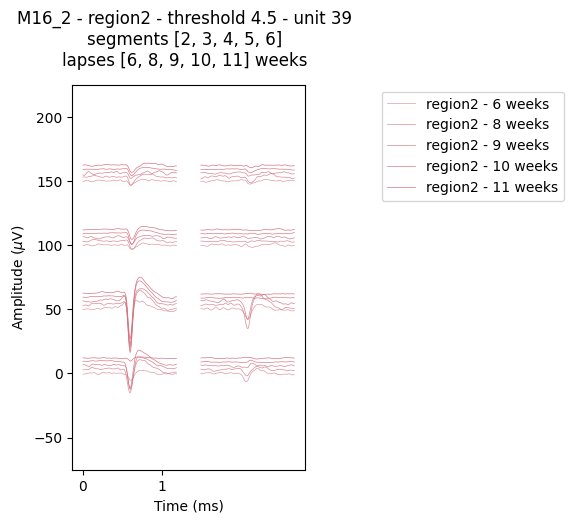

 Successfully redrawn all figures from NPZ.


In [5]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Load stored NPZ data
source_data_dir = "../source data/Figure 4"  
# figure_folder = "./Figure_3/Waveforms"
npz_path = os.path.join(source_data_dir, "templates_data.npz")
npz_file = np.load(npz_path, allow_pickle=True)

segment_gap = 3
trace_gap = (150, 50)

for unit_key in npz_file.files:
    data = npz_file[unit_key].item()

    subject = data["subject"]
    region = data["region"]
    threshold = data["threshold"]
    unit_id = data["unit_id"]
    unit_segments = data["unit_segments"]
    time_lapses = data["time_lapses"]
    color = data["color"]
    templates = data["templates"]

    # Dynamically generate template locations
    max_templates = max(len(template) for template in templates)
    template_location = [
        (i // 4 * trace_gap[0], (i % 4) * trace_gap[1]) for i in range(max_templates)
    ]

    # Create figure
    fig = plt.figure(figsize=(3, 5))
    fig.suptitle(f'{subject} - {region} - threshold {threshold} - unit {unit_id}\n'
                 f'segments {unit_segments}\nlapses {time_lapses} weeks', y=1.03)

    # Plot stored templates
    for plot_index, (segment, template) in enumerate(zip(unit_segments, templates)):
        for template_index, waveform in enumerate(template):
            if template_index >= len(template_location):
                continue  # Avoid index error

            plt.plot(
                np.arange(len(waveform)) + template_location[template_index][0],
                np.array(waveform) + template_location[template_index][1] + plot_index * segment_gap,
                color=color,
                alpha=min(1, 0.4 + 0.6 * time_lapses[plot_index] / 12),
                linewidth=0.5,
                label=f"{region} - {time_lapses[plot_index]} weeks" if template_index == 0 else None,
            )

    plt.ylim(-75, 225)
    plt.xticks([0, 100], [0, 1])
    plt.xlabel('Time (ms)')
    plt.ylabel(f'Amplitude ($\mu$V)')
    plt.legend(bbox_to_anchor=(1.3, 1))

    # Show figure in Jupyter Notebook
    plt.show()

    # Save figure
    # plt.savefig(os.path.join(figure_folder, f"{unit_key}_redrawn.png"), bbox_inches='tight', transparent=True)
    plt.close()

print(" Successfully redrawn all figures from NPZ.")